# **Detección de tumores en escáner cerebral**
**Héctor Jordà López**


Indicar COLAB = True si se abre el archivo desde Google Colab.

Indicar TRAINNING = True si se desea entrenar el modelo. En caso de FALSE, se cargará desde google Drive el último modelo entrenado que haya obtenido el mejor resultado.

In [ ]:
COLAB = True
TRAINNING = False
TRAINNING_TL = True

## Importación Dataset i Librerias

In [ ]:
if COLAB:
    !pip install h5py==2.10.0

     |████████████████████████████████| 2.9 MB 5.3 MB/s 
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
from glob import glob
from google_drive_downloader import GoogleDriveDownloader as gdd

from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from keras.layers import Conv2D, MaxPool2D, LeakyReLU, BatchNormalization, Dropout, Dense, InputLayer, Flatten
from keras.losses import BinaryCrossentropy


Descargamos desde Google Drive el último mejor modelo entrenado. Será este el modelo que cargaremos en el caso de que la variable TRAINNING = False

In [ ]:
modelpath= './best_model.h5'

gdd.download_file_from_google_drive(file_id='1SrjNa-Kc8dWdP-wLYMsQIFjDQwD8kOqB', dest_path=modelpath)

Descargamos desde Google Drive nuestras credenciales de Kaggle que nos permitirán descargar el dataset directamente desde su web.

In [ ]:
kagglepath = './kaggle.json'

gdd.download_file_from_google_drive(file_id='1aUhvfyUwv5T4VGs0Rn-HVHyqLER7rfTQ', dest_path=kagglepath)

In [ ]:
! pip install kaggle

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download preetviradiya/brian-tumor-dataset

 99% 106M/107M [00:01<00:00, 99.2MB/s] 
100% 107M/107M [00:01<00:00, 89.2MB/s]


In [ ]:
! unzip brian-tumor-dataset.zip &> /dev/null

In [ ]:
! rm brian-tumor-dataset.zip

## Preprocesamiento de datos

Creamos un DataFrame con el fichero 'metadata.csv' que se incluye en el dataset.

In [ ]:
df = pd.read_csv('metadata.csv', index_col=0)
df

,image,class,format,mode,shape
0,Cancer (1).jpg,tumor,JPEG,RGB,"(512, 512, 3)"
1,Cancer (1).png,tumor,PNG,L,"(300, 240)"
2,Cancer (1).tif,tumor,TIFF,RGB,"(256, 256, 3)"
3,Cancer (10).jpg,tumor,JPEG,RGB,"(512, 512, 3)"
4,Cancer (10).tif,tumor,TIFF,RGB,"(256, 256, 3)"
...,...,...,...,...,...
4595,Not Cancer (995).jpg,normal,JPEG,RGB,"(168, 300, 3)"
4596,Not Cancer (996).jpg,normal,JPEG,RGB,"(509, 452, 3)"
4597,Not Cancer (997).jpg,normal,JPEG,RGB,"(197, 177, 3)"
4598,Not Cancer (998).jpg,normal,JPEG,RGB,"(217, 232, 3)"


Observamos el número de muestras que contiene (4600) y que no están repartidas equitativamente: hay unas 500 imágenes más con tumor que sanas.

In [ ]:
print('Imágenes totales =', len(df))
print('Imágenes tumor =', len(df[df['class'] == 'tumor']))
print('Imágenes sanas =', len(df[df['class'] == 'normal']))

Imágenes totales = 4600
Imágenes tumor = 2513
Imágenes sanas = 2087


In [ ]:
df["class"].value_counts() / len(df) * 100

tumor     54.630435
normal    45.369565
Name: class, dtype: float64

In [ ]:
df = df.iloc[400:]
df

,image,class,format,mode,shape
400,Cancer (1353).jpg,tumor,JPEG,RGB,"(354, 279, 3)"
401,Cancer (1354).jpg,tumor,JPEG,RGB,"(318, 273, 3)"
402,Cancer (1355).jpg,tumor,JPEG,RGB,"(347, 300, 3)"
403,Cancer (1356).jpg,tumor,JPEG,RGB,"(173, 189, 3)"
404,Cancer (1357).jpg,tumor,JPEG,RGB,"(359, 297, 3)"
...,...,...,...,...,...
4595,Not Cancer (995).jpg,normal,JPEG,RGB,"(168, 300, 3)"
4596,Not Cancer (996).jpg,normal,JPEG,RGB,"(509, 452, 3)"
4597,Not Cancer (997).jpg,normal,JPEG,RGB,"(197, 177, 3)"
4598,Not Cancer (998).jpg,normal,JPEG,RGB,"(217, 232, 3)"


In [ ]:
df.reset_index(drop=True, inplace=True)
df

,image,class,format,mode,shape
0,Cancer (1353).jpg,tumor,JPEG,RGB,"(354, 279, 3)"
1,Cancer (1354).jpg,tumor,JPEG,RGB,"(318, 273, 3)"
2,Cancer (1355).jpg,tumor,JPEG,RGB,"(347, 300, 3)"
3,Cancer (1356).jpg,tumor,JPEG,RGB,"(173, 189, 3)"
4,Cancer (1357).jpg,tumor,JPEG,RGB,"(359, 297, 3)"
...,...,...,...,...,...
4195,Not Cancer (995).jpg,normal,JPEG,RGB,"(168, 300, 3)"
4196,Not Cancer (996).jpg,normal,JPEG,RGB,"(509, 452, 3)"
4197,Not Cancer (997).jpg,normal,JPEG,RGB,"(197, 177, 3)"
4198,Not Cancer (998).jpg,normal,JPEG,RGB,"(217, 232, 3)"


In [ ]:
print('Imágenes totales =', len(df))
print('Imágenes tumor =', len(df[df['class'] == 'tumor']))
print('Imágenes sanas =', len(df[df['class'] == 'normal']))

Imágenes totales = 4200
Imágenes tumor = 2113
Imágenes sanas = 2087


In [ ]:
df["class"].value_counts() / len(df) * 100

tumor     50.309524
normal    49.690476
Name: class, dtype: float64

Añadimos una nueva columna 'filepath' para incluir la ruta dóndese encuentran las imágenes:

In [ ]:
path_Tumor = './Brain Tumor Data Set/Brain Tumor Data Set/Brain Tumor/'
path_Healthy = './Brain Tumor Data Set/Brain Tumor Data Set/Healthy/'

df['filepath'] = ''

for i in range(len(df)):
  if df['class'][i] == 'tumor':
    df['filepath'][i] = path_Tumor + df['image'][i]
  else:
    df['filepath'][i] = path_Healthy + df['image'][i]

df.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the

,image,class,format,mode,shape,filepath
0,Cancer (1353).jpg,tumor,JPEG,RGB,"(354, 279, 3)",./Brain Tumor Data Set/Brain Tumor Data Set/Br...
1,Cancer (1354).jpg,tumor,JPEG,RGB,"(318, 273, 3)",./Brain Tumor Data Set/Brain Tumor Data Set/Br...
2,Cancer (1355).jpg,tumor,JPEG,RGB,"(347, 300, 3)",./Brain Tumor Data Set/Brain Tumor Data Set/Br...
3,Cancer (1356).jpg,tumor,JPEG,RGB,"(173, 189, 3)",./Brain Tumor Data Set/Brain Tumor Data Set/Br...
4,Cancer (1357).jpg,tumor,JPEG,RGB,"(359, 297, 3)",./Brain Tumor Data Set/Brain Tumor Data Set/Br...


Nos quedamos solo con la columna creeada anteriormente así como la columna que indica la clase a la que pertenece cada imagen (tumor/normal). En este caso, la columna clase será nuestro target a predecir.

In [ ]:
df.drop(['image','format','mode','shape'], axis=1, inplace=True)
df.head()

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,class,filepath
0,tumor,./Brain Tumor Data Set/Brain Tumor Data Set/Br...
1,tumor,./Brain Tumor Data Set/Brain Tumor Data Set/Br...
2,tumor,./Brain Tumor Data Set/Brain Tumor Data Set/Br...
3,tumor,./Brain Tumor Data Set/Brain Tumor Data Set/Br...
4,tumor,./Brain Tumor Data Set/Brain Tumor Data Set/Br...


Separamos nuestro dataset en los subconjuntos de entrenamiento, validación y test. 

Primeramente asignamos un 10% del total de muestras del dataset al subconjunto de test, dejando el 90% restante al subconjunto de [entrenamiento + validación].

Seguidamente, para el conjunto de [entrenamiento + validación] asignamos un 20% a validación, dejando un 80% para entrenamiento.

Como resultado, nos quedan el siguiente número de muestras:


*   Entrenamiento: 3024
*   Validación: 756
*   Test: 420



In [ ]:
train_val, test = train_test_split(df, test_size=0.1, random_state=123, stratify=df["class"])
train, val = train_test_split(train_val, test_size=0.2, random_state=123, stratify=train_val["class"])

In [ ]:
print(len(train), len(val), len(test))

3024 756 420


In [ ]:
train["class"].value_counts()

tumor     1522
normal    1502
Name: class, dtype: int64

In [ ]:
train["class"].value_counts() / len(train) * 100

tumor     50.330688
normal    49.669312
Name: class, dtype: float64

In [ ]:
val["class"].value_counts()

tumor     380
normal    376
Name: class, dtype: int64

In [ ]:
val["class"].value_counts() / len(val) * 100

tumor     50.26455
normal    49.73545
Name: class, dtype: float64

In [ ]:
test["class"].value_counts()

tumor     211
normal    209
Name: class, dtype: int64

In [ ]:
test["class"].value_counts() / len(test) * 100

tumor     50.238095
normal    49.761905
Name: class, dtype: float64

Difinimos la función que nos normalizará las imágenes:

In [ ]:
def preprocess_input(x):
    return x/255.0

Definimos nuestro generador de imágenes que se encargará de la parte de  Data Augmentation. Al tratarse de imágenes médicas, esperamos que todas tengan un formato similar. Por esto, las variaciones introducidas en el subconjunto de entrenamiento a través de los parámetros no serán muy significantes:


*   **rotation_range = 5**: Las imágenes tendrán una rotación aleatoria de +/- 5 grados
*   **width_shift_range = 0.05**: Fracción del ancho total
*   **height_shift_range = 0.05**: Fracción del alto total
*   **fill_mode = 'reflect'**: Los puntos fuera de los límites se rellenan a modo espejo
*   **zoom range = 0.1**: Rango de zoom aleatorio

Para los subconjuntos de validación y entrenamiento no aplicamos Data Augmentation, solo la función de preprocesado definida anteriormente.





In [ ]:
train_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function = preprocess_input,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    fill_mode='reflect',
    shear_range=0.1,
    zoom_range=0.1)

val_datagen  = ImageDataGenerator(dtype='float32',
                                  preprocessing_function = preprocess_input)

test_datagen = ImageDataGenerator(dtype='float32',
                                  preprocessing_function = preprocess_input)

Definimos el tamaño al que queremos escalar todas las imágenes así como el tamaño del batch:

In [ ]:
normed_dims = (128,128)
batch_size = 64

Para cada subconjunto de datos indicamos dónde se encuentran las imágenes a través del DataFrame para que genere de forma automática los batches correspondientes:

In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train,
    x_col = "filepath",
    y_col = "class",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=True,
    color_mode="grayscale",
    class_mode='categorical') # binary: 0/1. Sparse: entero a partir de 0. Categorical: one hot

validation_generator = val_datagen.flow_from_dataframe(
    dataframe=val,
    x_col = "filepath",
    y_col = "class",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    color_mode="grayscale",
    class_mode='categorical') # binary: 0/1. Sparse: entero a partir de 0. Categorical: one hot

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test,
    x_col = "filepath",
    y_col = "class",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    color_mode="grayscale",
    class_mode='categorical') # binary: 0/1. Sparse: entero a partir de 0. Categorical: one hot

Found 3024 validated image filenames belonging to 2 classes.
Found 756 validated image filenames belonging to 2 classes.
Found 420 validated image filenames belonging to 2 classes.


Muestra 5 imágenes a modo de ejemplo:

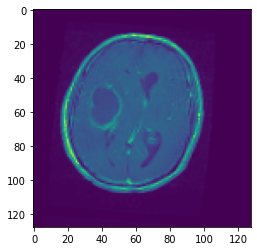

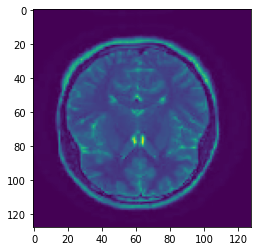

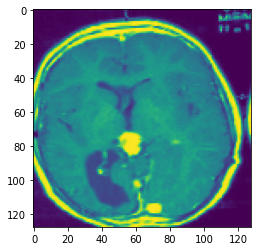

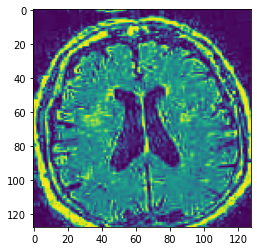

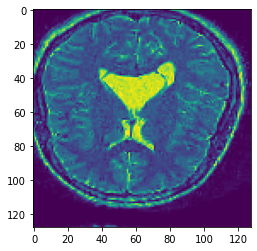

In [ ]:
batch = next(train_generator)

for i in range(5):
  plt.figure()
  plt.imshow(batch[0][i].squeeze())

## Definición del Modelo

Definimos nuestro modelo. En este caso usaremos una primera parte formada por capas convolucionales (se encargará de extraer las características de las imágenes) y una segunda parte formada por capas densas (encargada de realizar la clasificación de las imágenes):

In [ ]:
model = keras.Sequential()

# Parte 1 - Capas convolucionales
model.add(InputLayer(input_shape=normed_dims+(1,)))
model.add(Conv2D(filters=8,kernel_size=7, activation="relu", padding="same"))
model.add(MaxPool2D())
model.add(Conv2D(filters=16,kernel_size=5, activation="relu", padding="same"))
model.add(MaxPool2D())
model.add(Conv2D(filters=32,kernel_size=3, activation="relu", padding="same"))
model.add(MaxPool2D())
model.add(Conv2D(filters=64,kernel_size=3, activation="relu", padding="same"))
model.add(MaxPool2D())

model.add(Flatten())

# Parte 2 - Capas densas
model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(rate=0.3))
model.add(Dense(64, activation="relu"))
model.add(BatchNormalization())
model.add(Dropout(rate=0.3))
model.add(Dense(2, activation="softmax"))


model.compile(optimizer=keras.optimizers.Adam(),loss ='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 8)       400       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 8)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 16)        3216      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 16)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 32)       0

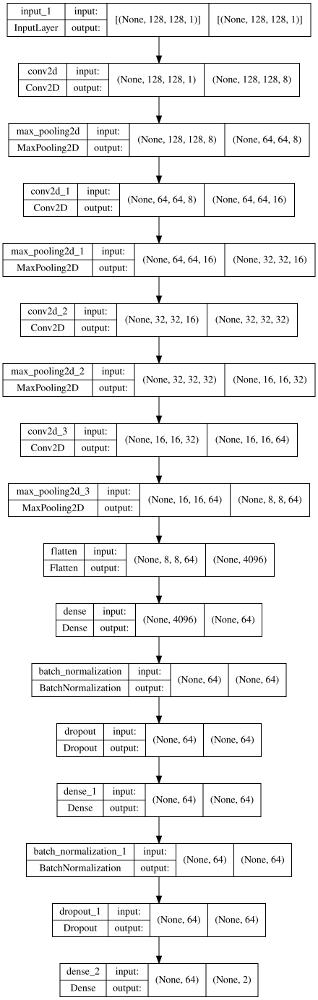

In [ ]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

if COLAB:
    display(SVG(model_to_dot(model, show_shapes=True,dpi=72).create(prog='dot', format='svg')))
else:
    display(SVG(model_to_dot(model, show_shapes=True).create(prog='dot', format='svg')))

## Entrenamiento del Modelo

In [ ]:
from matplotlib.ticker import MaxNLocator

# Función auxiliar para mostrar el progreso del entrenamiento
def grafica_entrenamiento(tr_acc, val_acc, tr_loss, val_loss, best_i,
                          figsize=(10,4)):
    plt.figure(figsize=figsize)
    ax = plt.subplot(1,2,1)
    plt.plot(1+np.arange(len(tr_acc)),  100*np.array(tr_acc))
    plt.plot(1+np.arange(len(val_acc)), 100*np.array(val_acc))
    plt.plot(1+best_i, 100*val_acc[best_i], 'or')
    plt.title('tasa de acierto del modelo (%)', fontsize=18)
    plt.ylabel('tasa de acierto (%)', fontsize=18)
    plt.xlabel('época', fontsize=18)
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    plt.subplot(1,2,2)
    plt.plot(1+np.arange(len(tr_acc)), np.array(tr_loss))
    plt.plot(1+np.arange(len(val_acc)), np.array(val_loss))
    plt.plot(1+best_i, val_loss[best_i], 'or')
    plt.title('loss del modelo', fontsize=18)
    plt.ylabel('loss', fontsize=18)
    plt.xlabel('época', fontsize=18)
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

In [ ]:
# Inicialización de valores que vamos a mostrar en las gráficas
acum_tr_acc = []
acum_val_acc = []
best_val_acc = -1000
acum_tr_loss  = []
acum_val_loss = []

In [ ]:
from keras.callbacks import ModelCheckpoint
from IPython.display import SVG, display, clear_output
from keras.models import Sequential, load_model, Model

In [ ]:
number_train_samples = train_generator.n
number_val_samples   = validation_generator.n
number_test_samples  = test_generator.n

number_train_samples, number_val_samples, number_test_samples

(3024, 756, 420)

Definimos el entrenamiento. En este caso vamos a entronar época a época, de manera que nos guardamos el mejor modelo hasta el momento:

In [ ]:
# Definimos el número de épocas
epochs = 10

# graba sólo los que mejoran en validación
checkpoint = ModelCheckpoint(modelpath, monitor='val_accuracy', verbose=1,
                             save_best_only=True,
                             mode='max')
callbacks_list = [checkpoint]

if TRAINNING:
  for e in range(epochs):
      history = model.fit(train_generator, 
                          steps_per_epoch=number_train_samples // batch_size,
                          epochs=1,
                          callbacks=callbacks_list,
                          verbose=1,
                          shuffle = False,
                          validation_data=validation_generator,
                          validation_steps=number_val_samples // batch_size
                        )
      
      if history.history['val_accuracy'][-1] > best_val_acc:
          print("Validation accuracy improved from",
              best_val_acc, 'to', history.history['val_accuracy'])
          print("saving weights")
          best_val_acc = history.history['val_accuracy'][-1]
      
      acum_tr_acc.append(history.history['accuracy'][0])
      acum_val_acc.append(history.history['val_accuracy'][0])
      acum_tr_loss.append(history.history['loss'][0])
      acum_val_loss.append(history.history['val_loss'][0])
      
      if len(acum_tr_acc) > 1:
          clear_output()
          best_i = np.argmax(acum_val_acc)
          grafica_entrenamiento(acum_tr_acc, acum_val_acc, acum_tr_loss, acum_val_loss, best_i)

Cargamos el mejor modelo:

In [ ]:
model = load_model(modelpath)

## Evaluación del Modelo

In [ ]:
scores_tr = model.evaluate(train_generator)
print('Train loss    :', scores_tr[0])
print('Train accuracy:', scores_tr[1])
print()

scores_val = model.evaluate(validation_generator)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = model.evaluate(test_generator)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

48/48 [==============================] - 31s 426ms/step - loss: 0.0498 - accuracy: 0.9818
Train loss    : 0.04977227374911308
Train accuracy: 0.9818121790885925

12/12 [==============================] - 5s 404ms/step - loss: 0.1266 - accuracy: 0.9630
Val loss    : 0.1265534609556198
Val accuracy: 0.9629629850387573

7/7 [==============================] - 3s 415ms/step - loss: 0.2414 - accuracy: 0.9452
Test loss     : 0.24138334393501282
Test accuracy : 0.9452381134033203


Comprobamos que con un modelo muy simple conseguimos unos buenos resultados, con casi un 98% de accuracy en entrenamiento y hasta un 95'7% en test

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, roc_auc_score

In [ ]:
y_real = test_generator.classes
y_pred_proba = model.predict(test_generator)
y_pred = np.argmax(y_pred_proba, axis=1)
print('')
print(classification_report(y_real, y_pred))


              precision    recall  f1-score   support

           0       0.94      0.95      0.95       209
           1       0.95      0.94      0.95       211

    accuracy                           0.95       420
   macro avg       0.95      0.95      0.95       420
weighted avg       0.95      0.95      0.95       420



In [ ]:
len(y_real), len(y_pred)

(420, 420)

In [ ]:
num2class = {test_generator.class_indices[x]:x  for x in test_generator.class_indices.keys()}
num2class

{0: 'normal', 1: 'tumor'}

In [ ]:
np.array(y_real)==1

array([False, False, False, False, False, False,  True, False, False,
       False,  True,  True, False, False, False, False,  True, False,
       False, False,  True, False,  True, False,  True, False, False,
       False,  True,  True, False, False, False,  True, False, False,
        True, False, False, False, False, False,  True, False,  True,
       False, False,  True,  True,  True,  True, False, False,  True,
        True,  True, False, False,  True, False,  True, False,  True,
        True,  True, False, False,  True, False, False,  True, False,
       False,  True, False,  True, False, False,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True, False,
        True, False, False,  True,  True,  True, False,  True, False,
        True,  True, False,  True, False, False, False,  True, False,
       False,  True,  True,  True,  True, False, False, False,  True,
        True, False, False,  True,  True,  True, False,  True, False,
        True, False,

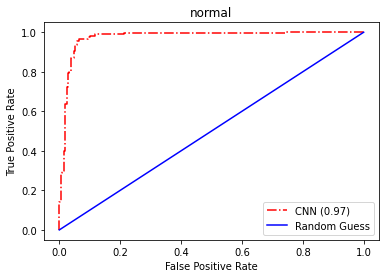

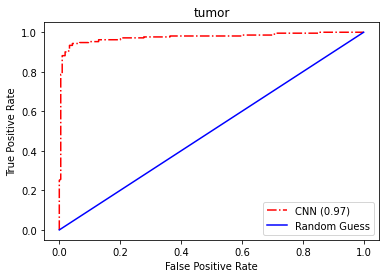

In [ ]:
for clase in range(2):
    nombre_clase = num2class[clase]

    fpr, tpr, thresholds = roc_curve(np.array(y_real)==clase, y_pred_proba[:,clase])
    fig, ax1 = plt.subplots(1,1)
    ax1.plot(fpr, tpr, 'r-.', label = 'CNN (%2.2f)' % auc(fpr, tpr))
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.plot(fpr, fpr, 'b-', label = 'Random Guess')
    ax1.set_title(nombre_clase)
    ax1.legend()
    plt.show()

## Visualización Feature Maps

En este apartado visualizaremos los mapas de características. De esta manera, podemos observar qué esta "aprendiendo" cada filtro en cada capa convolucional.

In [ ]:
from keras import models

In [ ]:
X_te, y_te = test_generator.next()
X_te.shape

(64, 128, 128, 1)

In [ ]:
ejemplo=5
X_te[10:11].shape

(1, 128, 128, 1)

In [ ]:
# Now we extract the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8:2]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(X_te[ejemplo:(ejemplo+1)])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


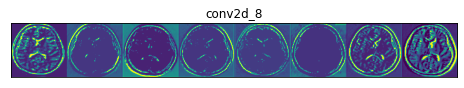

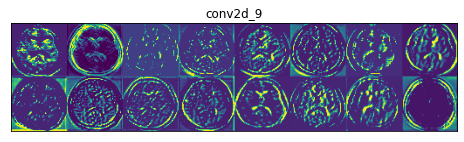

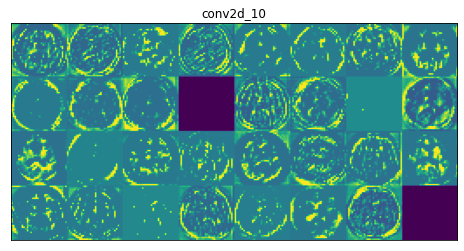

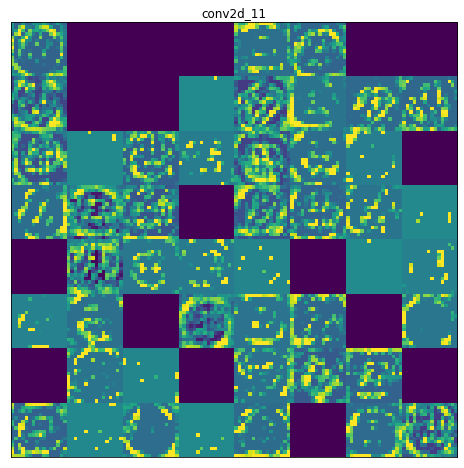

In [ ]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8:2]:
    layer_names.append(layer.name)

images_per_row = 8

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

Como cabía esperar, observamos una evolución desde las primeras capas convolucionales, donde se reconocen contornos simples horizontales y verticales, hasta la última capa, donde se reconocen patrones más complejos en la zona interior del cerebro.

## Visualización Heatmaps

En este apartado vamos a visualizar los HeatMaps o mapas de calor. Con esto, podemos tener una idea de en qué partes de la imágens se está "fijando" nustro modelo a la hora de decidir si se trata de una imágen correspondiente a un cerebro sano o, por el contrario, se trata de una imágen correspondiente a un cerebro con tumor.

**Funciones que calculan la sensibilidad de la salida a la entrada:**

In [ ]:
from keras import backend as K
import cv2

In [ ]:
class_indices = test_generator.class_indices
class_indices

{'normal': 0, 'tumor': 1}

In [ ]:
def find_ind_last_conv2D(model):
    ind_last_conv2D_layer = None
    for i,x in enumerate(model.layers):
        if x.__class__.__name__ == "Conv2D":
            ind_last_conv2D_layer = i
    return ind_last_conv2D_layer


def show_heatmap(model, im, real):
    imag = np.expand_dims(im, axis=0) # de 1 imagen pasamos a 1 conjunto de 1 imagen
        
    # The is the output feature map of the last convolutional layer
    last_conv_layer = model.layers[find_ind_last_conv2D(model)]
    
    # This is the gradient of the "benign" class with regard to
    # the output feature map of last convolutional layer
    with tf.GradientTape() as tape:
        aux = model.output
        #aux = model.layers[-2].output # salida de la última capa densa antes de softmax

        iterate = tf.keras.models.Model([model.inputs], [aux, last_conv_layer.output])
        model_out, last_conv_layer = iterate(imag)
        class_out = model_out[:, np.argmax(model_out[0])]
        grads = tape.gradient(class_out, last_conv_layer)

        # mean intensity of the gradient over a specific feature map channel:
        pooled_grads = K.mean(grads, axis=(0, 1, 2))
    
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)    
    heatmap = np.maximum(heatmap, 0) # se quitan los negativos (se ponen a 0)
    heatmap /= np.max(heatmap) # se normaliza entre 0 y 1
    heatmap = heatmap[0] # pasamos de 1 conjunto de 1 heatmap a 1 heatmap
    
    # We use cv2 to load the original image
    #img = cv2.imread(img_path)
    img = imag[0]
    
    img = np.zeros((im.shape[0],im.shape[1],1))
    #print(im.shape, imag.shape)
    #for i in range(3):
    img[:,:,0] = imag[0,:,:,0]

    
    # We resize the heatmap to have the same size as the original image
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    #print(heatmap.shape)
    # We convert the heatmap to RGB
    heatmap = np.uint8(255 * heatmap)
    #print(heatmap.shape)
    # We apply the heatmap to the original image
    #heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET) / 255
    #heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_BONE) / 255
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT) / 255
    #print(heatmap.shape)
    
    # 0.4 here is a heatmap intensity factor
    superimposed_img = heatmap * 0.5 + 0.5*im
    #print(heatmap.min(), heatmap.max(), heatmap.mean(), heatmap.std())
    #print(img.min(), img.max(), img.mean(), img.std())
    #print(superimposed_img.min(),  superimposed_img.max(),
    #      superimposed_img.mean(), superimposed_img.std())
    
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(im.squeeze(), vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.subplot(1,3,2)
    plt.imshow(heatmap, vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.subplot(1,3,3)
    plt.imshow(superimposed_img, vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.show()
    #print(np.shape(imag))
    prob = 100*model.predict(imag)[0][class_indices["normal"]]
    print("Probabilidad Healthy : {:2.1f}%".format(prob))
    prob = 100*model.predict(imag)[0][class_indices["tumor"]]
    print("Probabilidad Tumor: {:2.1f}%".format(prob))
    if real[0]==1:
      out = 'Healthy'
    else:
      out = 'Tumor'
    print('Real: ' + out)
    print("\n\n")
    return heatmap, superimposed_img

**Visualización de mapas de sensibilidades (heatmaps) en varios ejemplos:**

In [ ]:
X_te[i].max()

1.0

In [ ]:
X_te[i].shape

(128, 128, 1)

In [ ]:
np.stack([X_te[i]]*3, axis=2).squeeze().shape

(128, 128, 3)

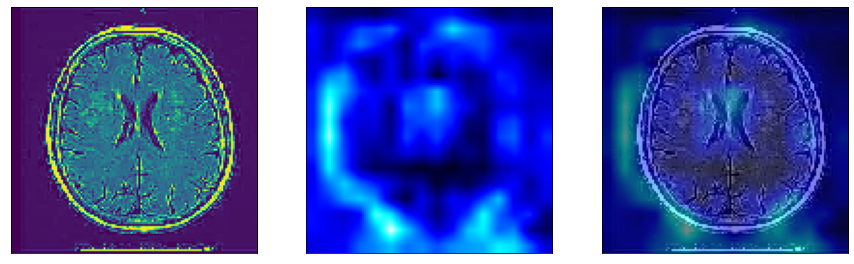

Probabilidad Healthy : 100.0%
Probabilidad Tumor: 0.0%
Real: Healthy





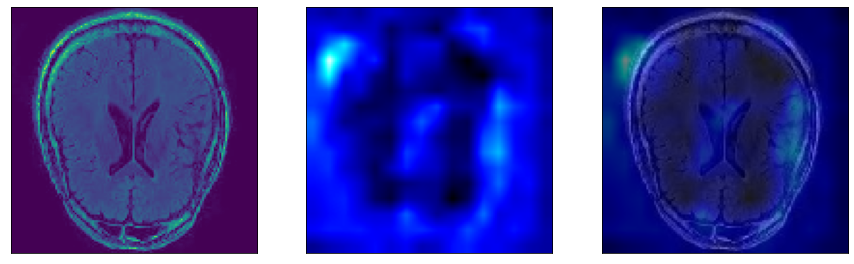

Probabilidad Healthy : 98.8%
Probabilidad Tumor: 1.2%
Real: Healthy





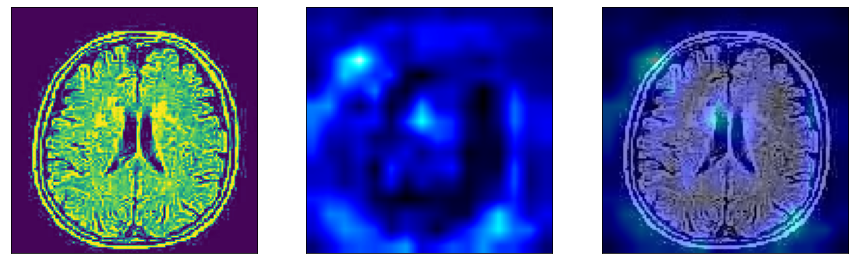

Probabilidad Healthy : 100.0%
Probabilidad Tumor: 0.0%
Real: Healthy





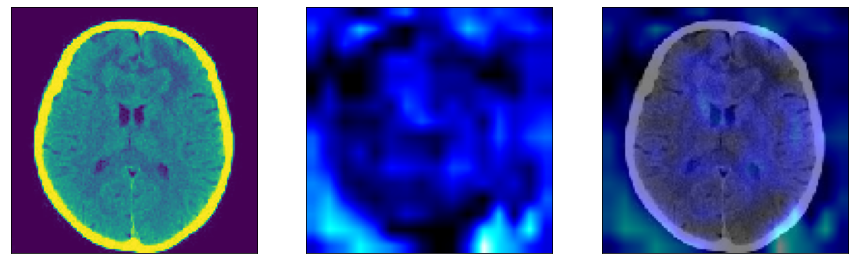

Probabilidad Healthy : 98.4%
Probabilidad Tumor: 1.6%
Real: Healthy





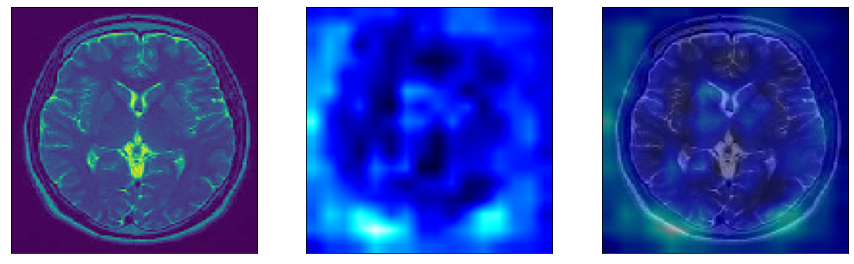

Probabilidad Healthy : 99.7%
Probabilidad Tumor: 0.3%
Real: Healthy





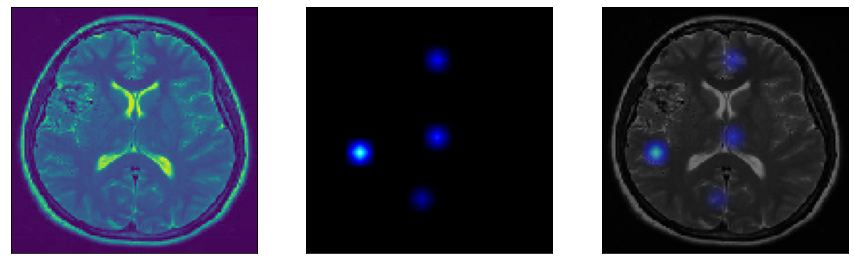

Probabilidad Healthy : 22.6%
Probabilidad Tumor: 77.4%
Real: Healthy





/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide


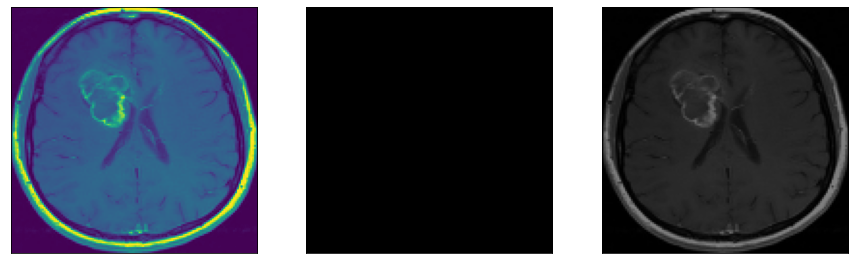

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





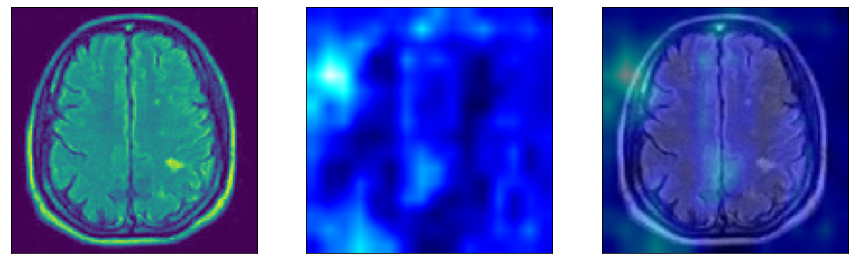

Probabilidad Healthy : 99.5%
Probabilidad Tumor: 0.5%
Real: Healthy





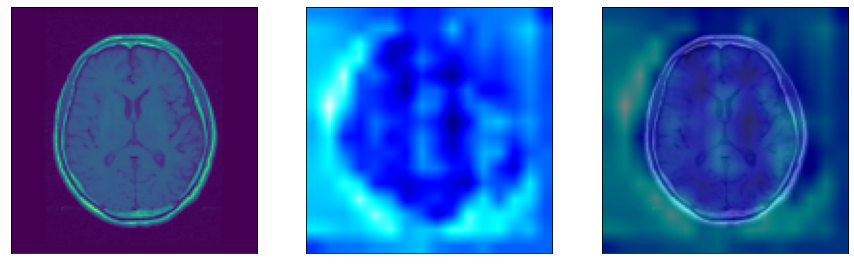

Probabilidad Healthy : 90.7%
Probabilidad Tumor: 9.3%
Real: Healthy





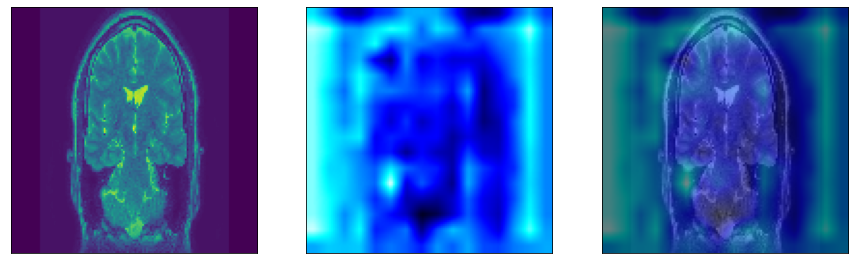

Probabilidad Healthy : 92.7%
Probabilidad Tumor: 7.3%
Real: Healthy





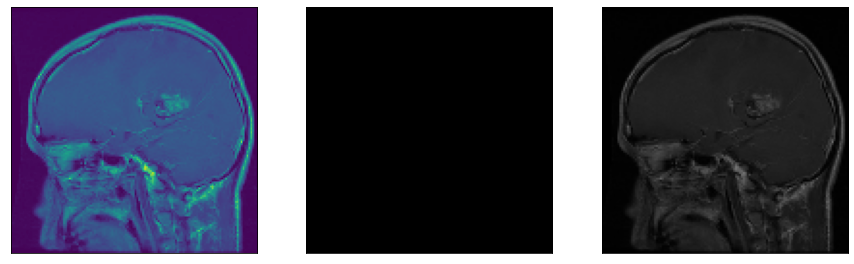

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





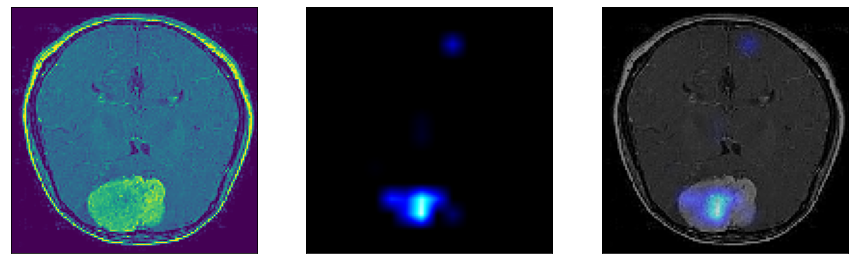

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





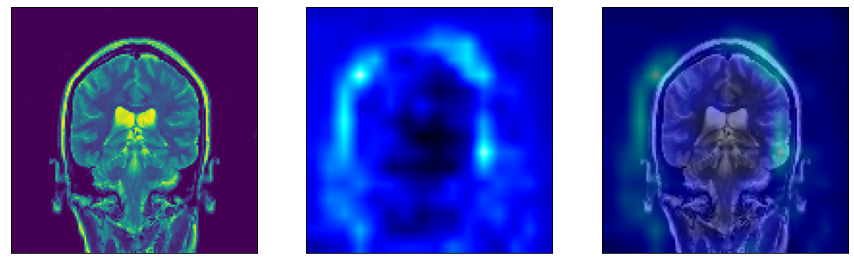

Probabilidad Healthy : 99.9%
Probabilidad Tumor: 0.1%
Real: Healthy





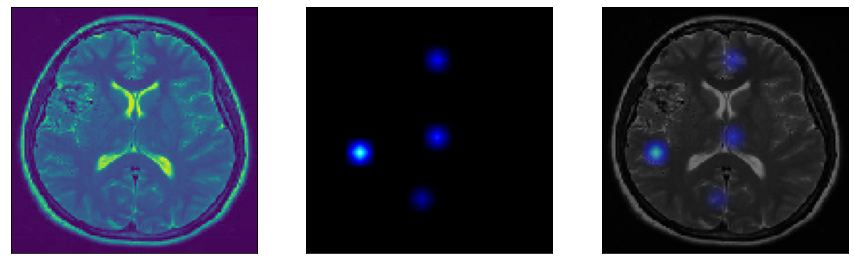

Probabilidad Healthy : 22.6%
Probabilidad Tumor: 77.4%
Real: Healthy





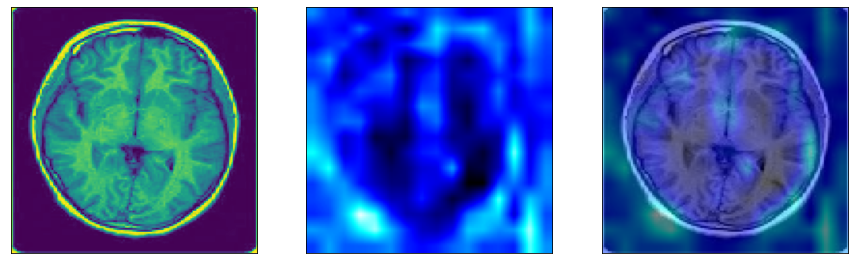

Probabilidad Healthy : 98.1%
Probabilidad Tumor: 1.9%
Real: Healthy





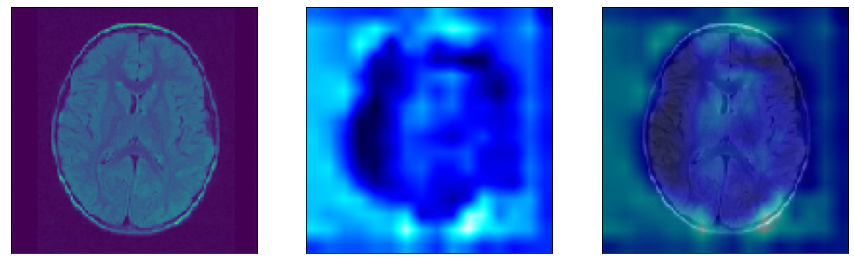

Probabilidad Healthy : 99.1%
Probabilidad Tumor: 0.9%
Real: Healthy





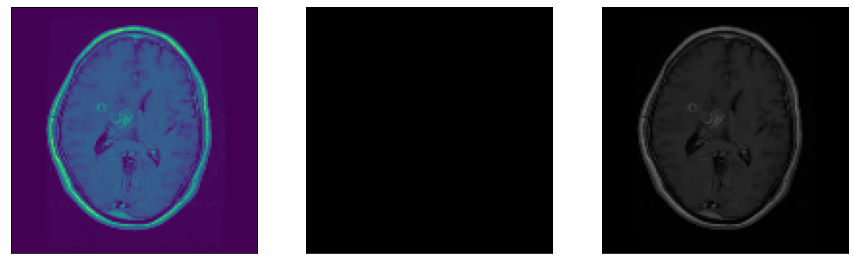

Probabilidad Healthy : 0.1%
Probabilidad Tumor: 99.9%
Real: Tumor





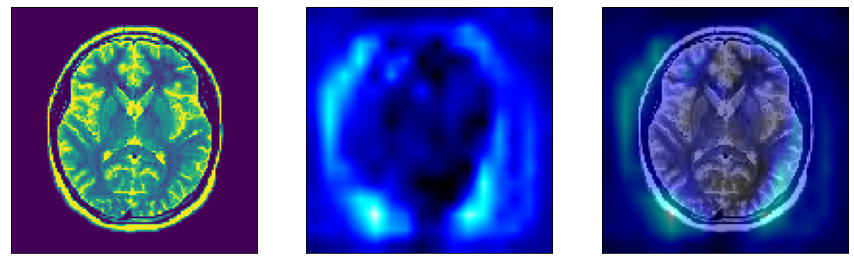

Probabilidad Healthy : 100.0%
Probabilidad Tumor: 0.0%
Real: Healthy





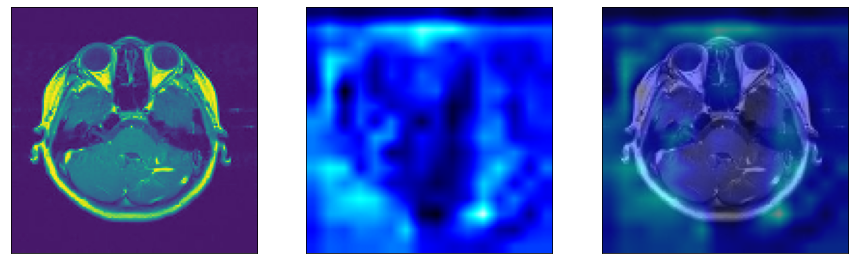

Probabilidad Healthy : 97.7%
Probabilidad Tumor: 2.3%
Real: Healthy





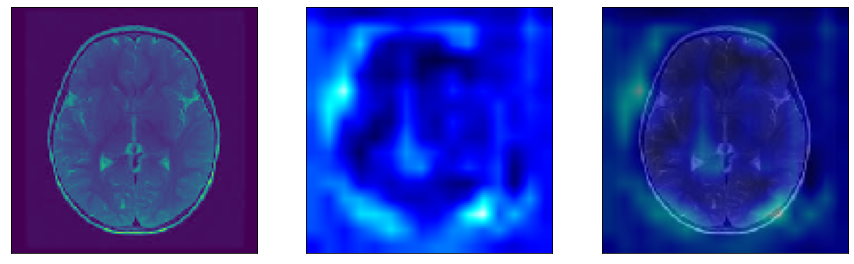

Probabilidad Healthy : 99.7%
Probabilidad Tumor: 0.3%
Real: Healthy





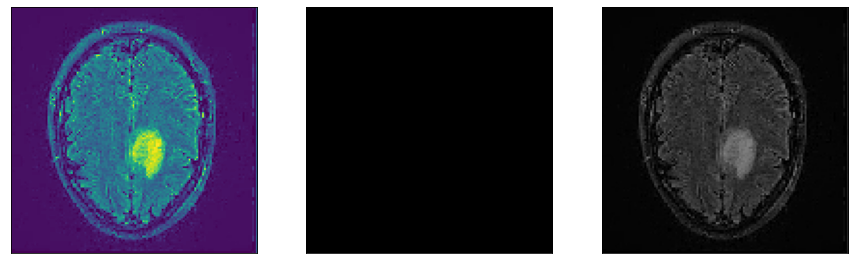

Probabilidad Healthy : 0.2%
Probabilidad Tumor: 99.8%
Real: Tumor





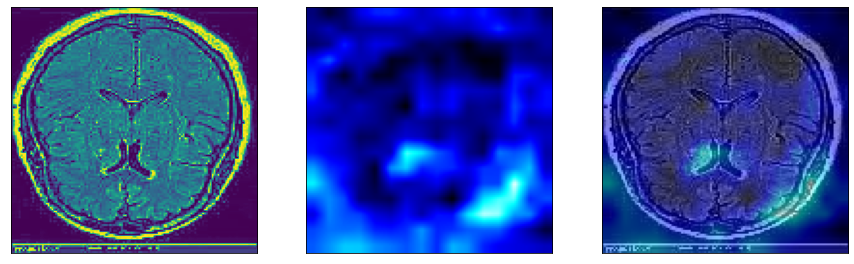

Probabilidad Healthy : 97.6%
Probabilidad Tumor: 2.4%
Real: Healthy





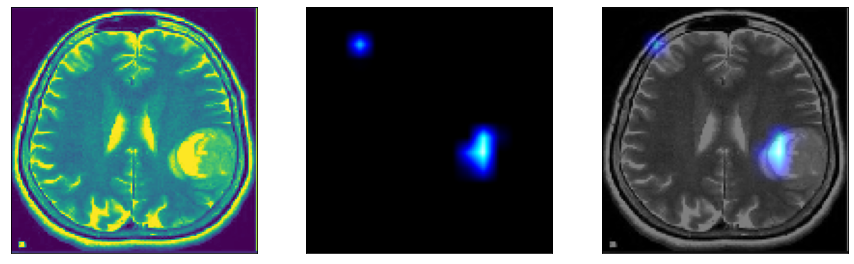

Probabilidad Healthy : 1.0%
Probabilidad Tumor: 99.0%
Real: Tumor





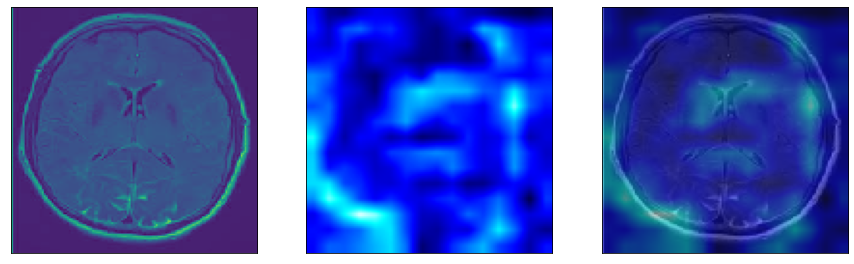

Probabilidad Healthy : 92.9%
Probabilidad Tumor: 7.1%
Real: Healthy





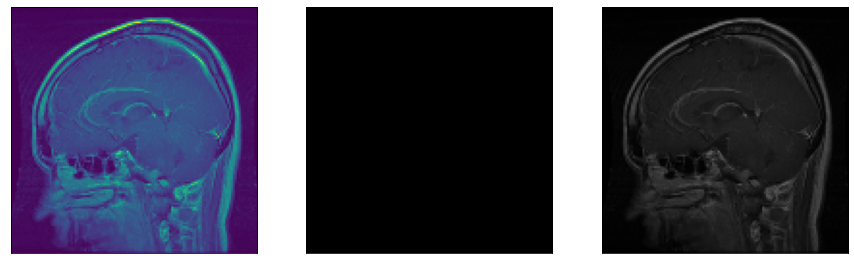

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





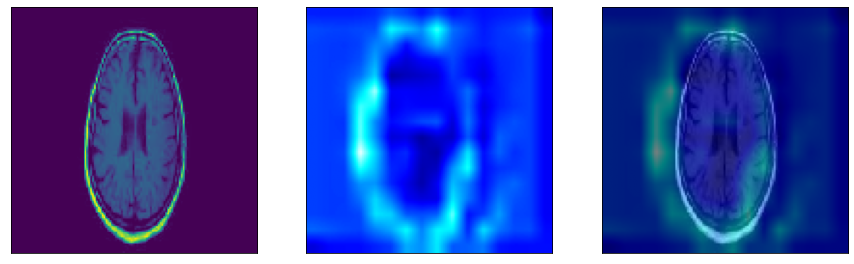

Probabilidad Healthy : 98.6%
Probabilidad Tumor: 1.4%
Real: Healthy





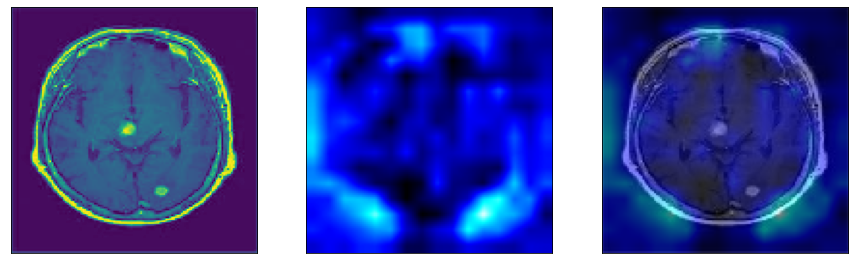

Probabilidad Healthy : 70.2%
Probabilidad Tumor: 29.8%
Real: Healthy





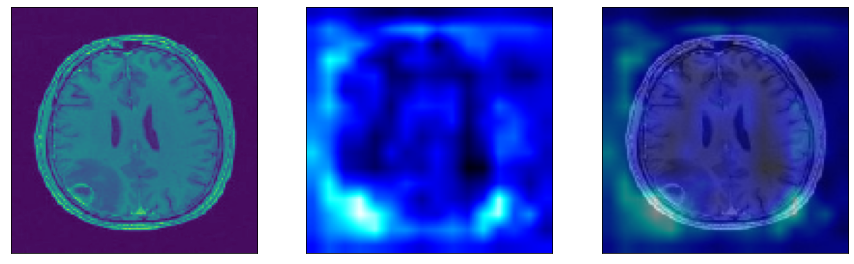

Probabilidad Healthy : 82.4%
Probabilidad Tumor: 17.6%
Real: Healthy





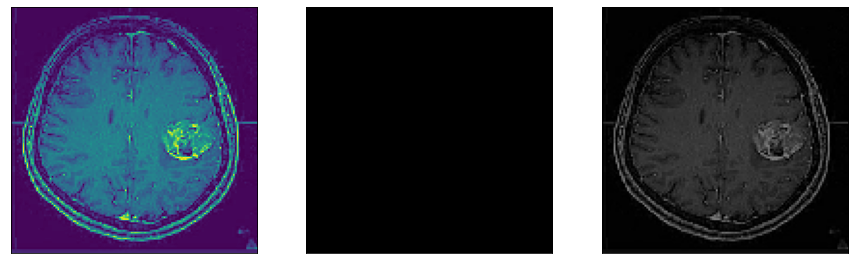

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





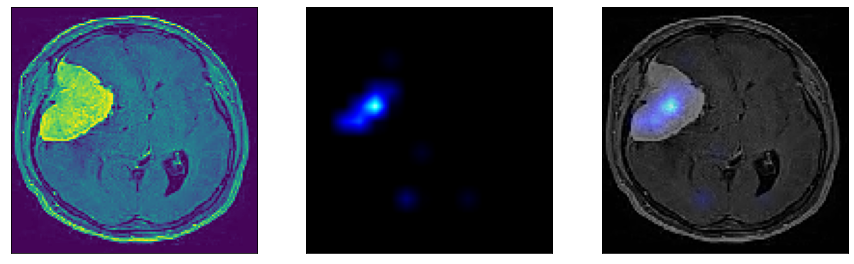

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





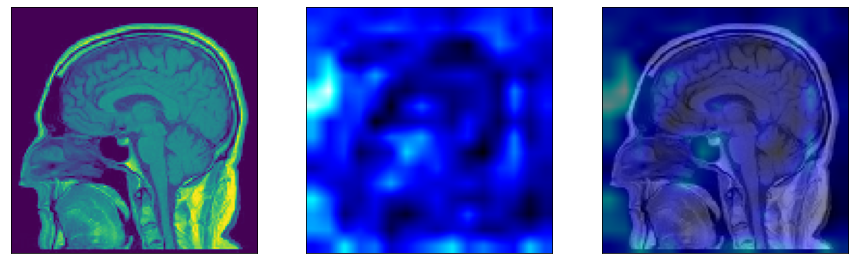

Probabilidad Healthy : 99.8%
Probabilidad Tumor: 0.2%
Real: Healthy





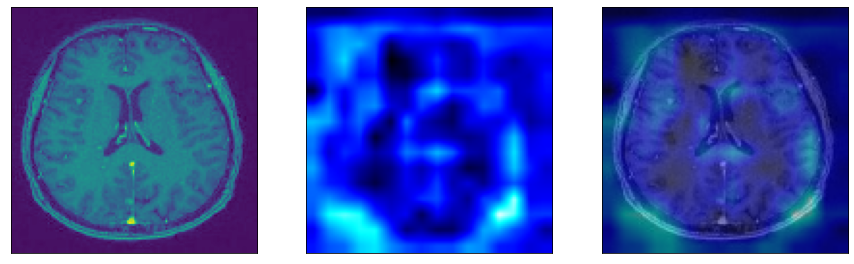

Probabilidad Healthy : 99.1%
Probabilidad Tumor: 0.9%
Real: Healthy





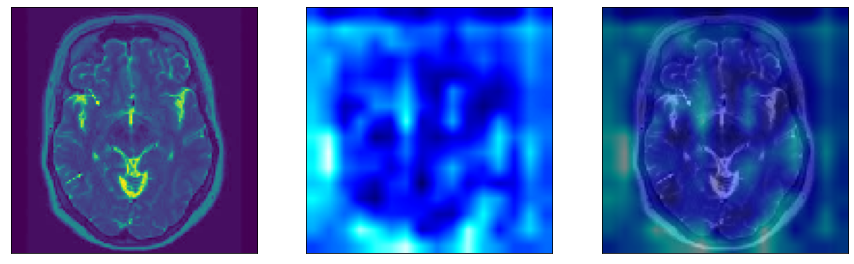

Probabilidad Healthy : 98.5%
Probabilidad Tumor: 1.5%
Real: Healthy





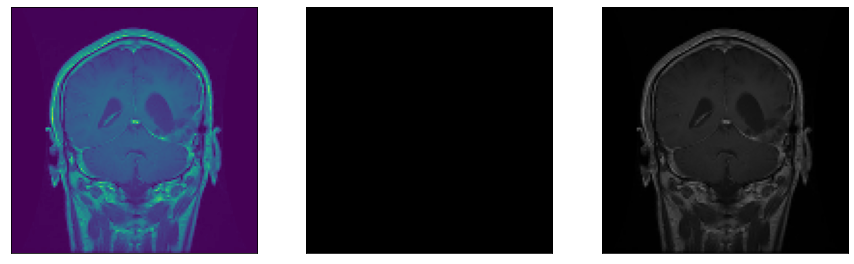

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





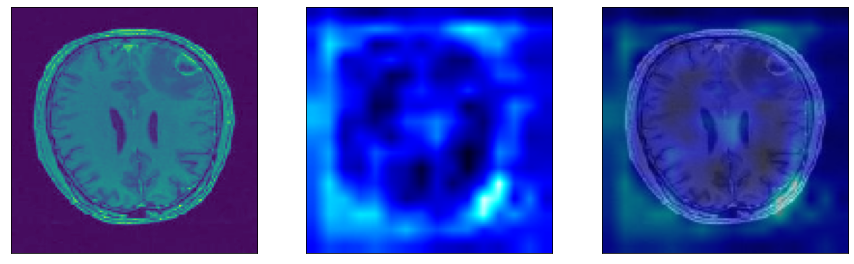

Probabilidad Healthy : 97.6%
Probabilidad Tumor: 2.4%
Real: Healthy





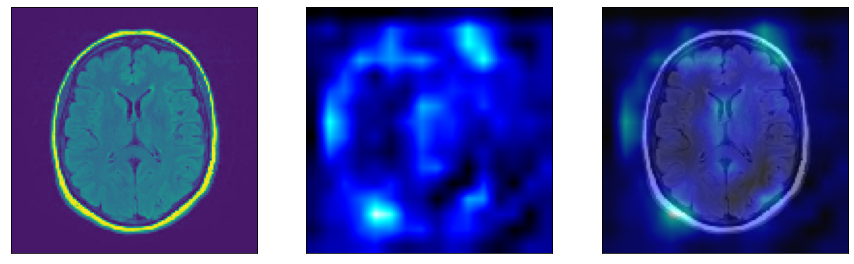

Probabilidad Healthy : 100.0%
Probabilidad Tumor: 0.0%
Real: Healthy





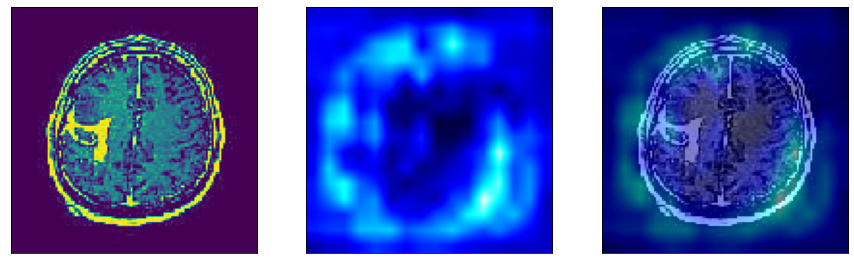

Probabilidad Healthy : 99.9%
Probabilidad Tumor: 0.1%
Real: Tumor





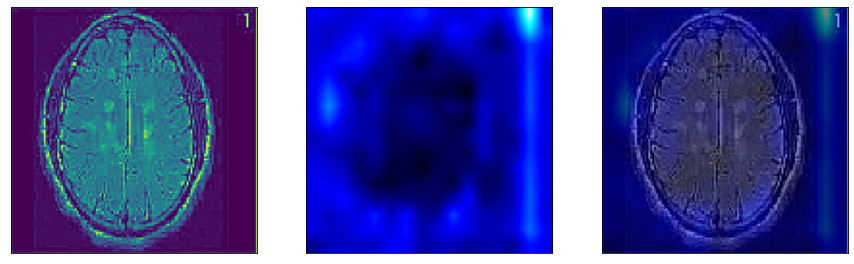

Probabilidad Healthy : 94.9%
Probabilidad Tumor: 5.1%
Real: Healthy





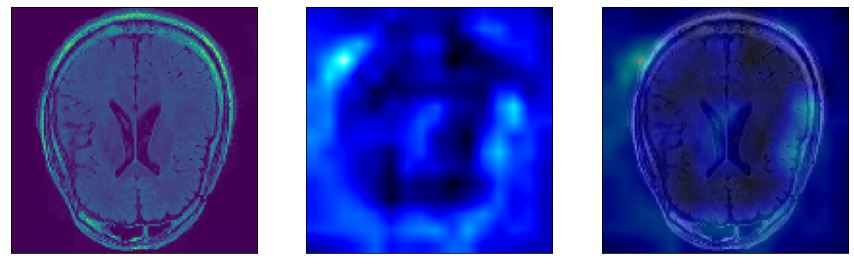

Probabilidad Healthy : 73.9%
Probabilidad Tumor: 26.1%
Real: Healthy





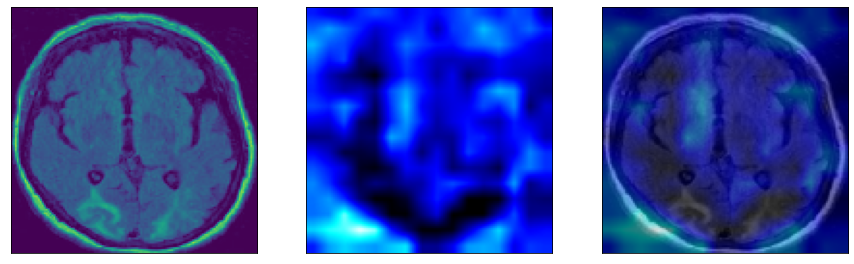

Probabilidad Healthy : 93.2%
Probabilidad Tumor: 6.8%
Real: Healthy





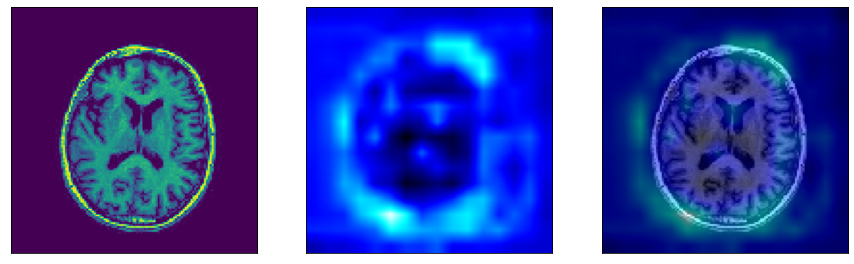

Probabilidad Healthy : 100.0%
Probabilidad Tumor: 0.0%
Real: Healthy





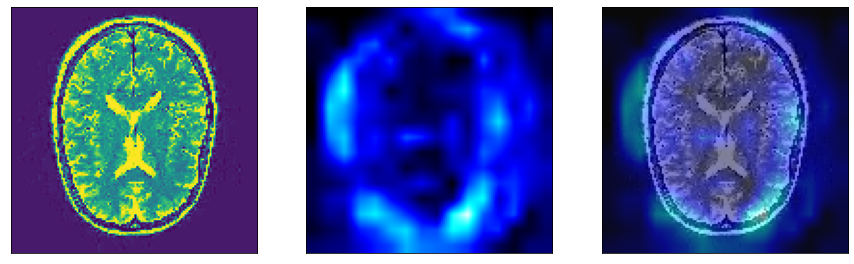

Probabilidad Healthy : 100.0%
Probabilidad Tumor: 0.0%
Real: Healthy





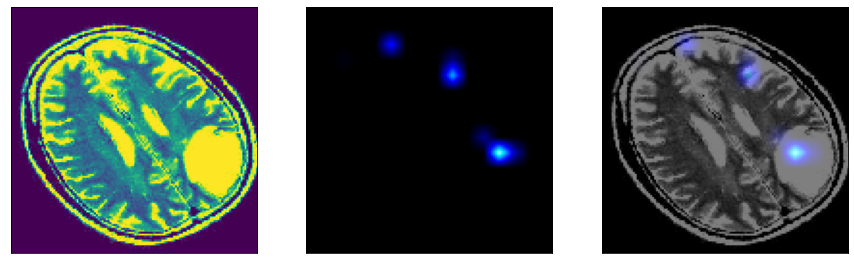

Probabilidad Healthy : 25.3%
Probabilidad Tumor: 74.7%
Real: Tumor





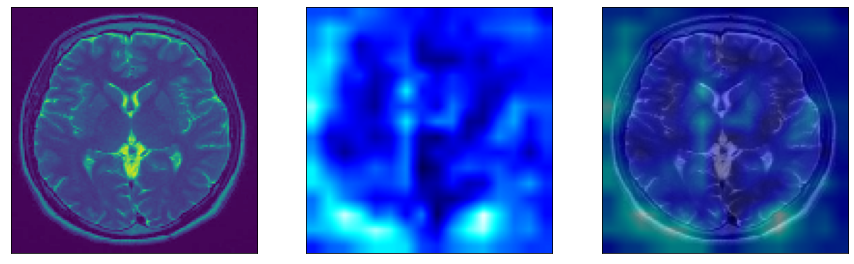

Probabilidad Healthy : 98.6%
Probabilidad Tumor: 1.4%
Real: Healthy





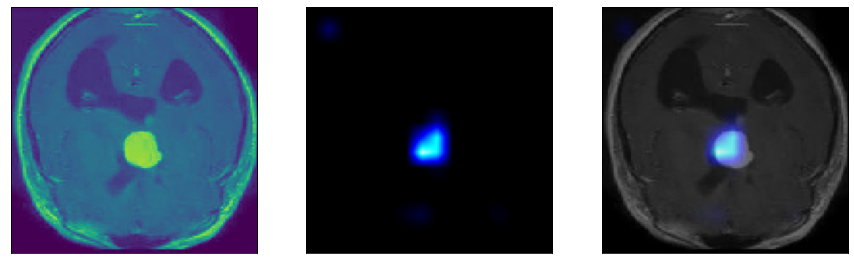

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





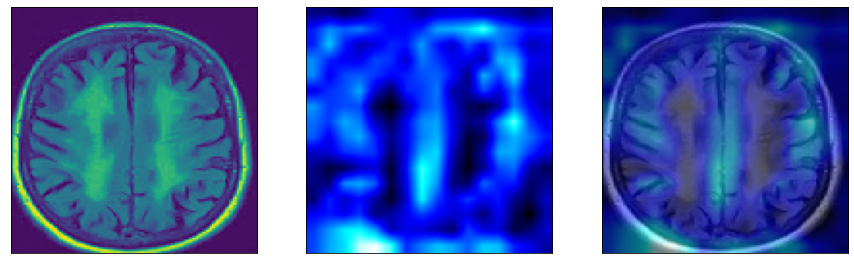

Probabilidad Healthy : 98.9%
Probabilidad Tumor: 1.1%
Real: Healthy





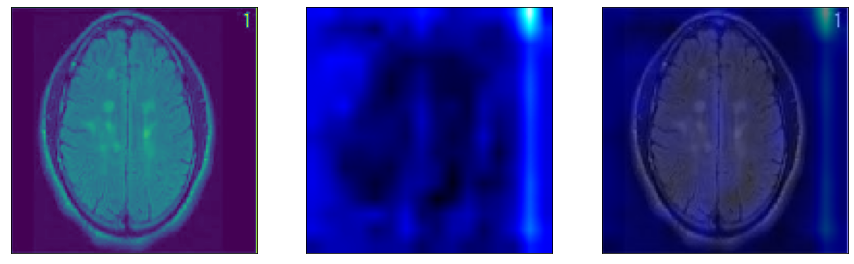

Probabilidad Healthy : 99.7%
Probabilidad Tumor: 0.3%
Real: Healthy





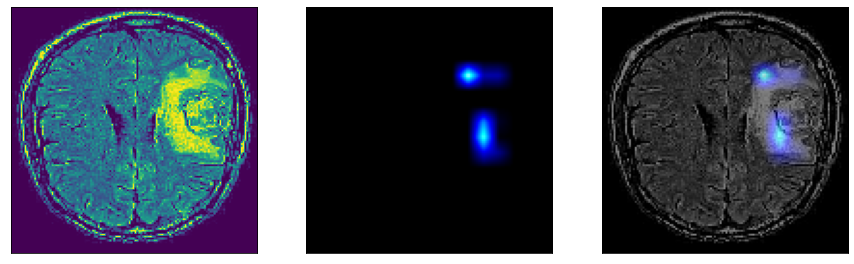

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





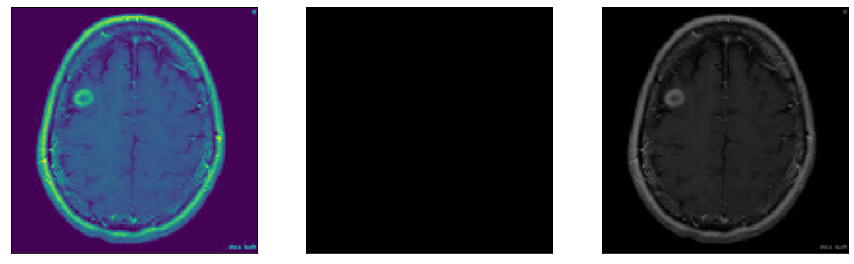

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





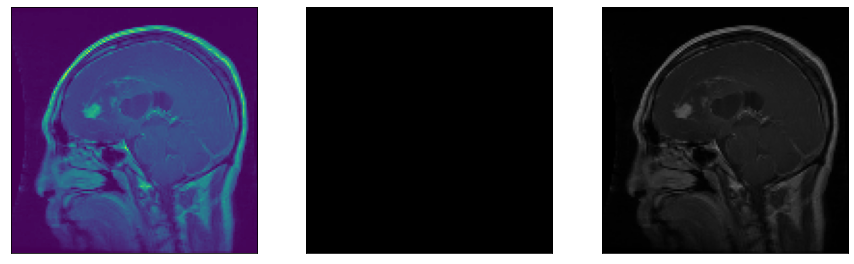

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





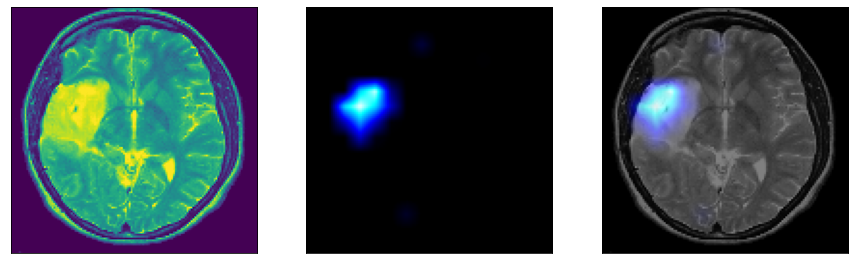

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





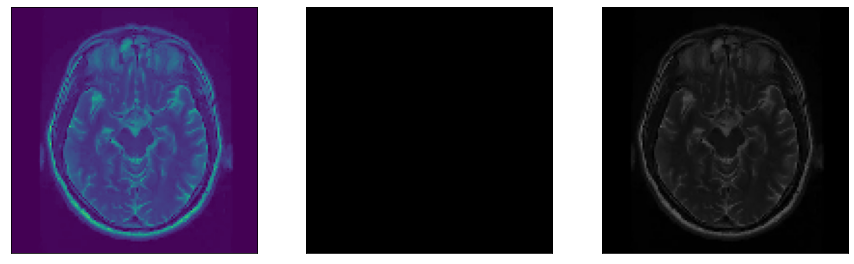

Probabilidad Healthy : 3.6%
Probabilidad Tumor: 96.4%
Real: Healthy





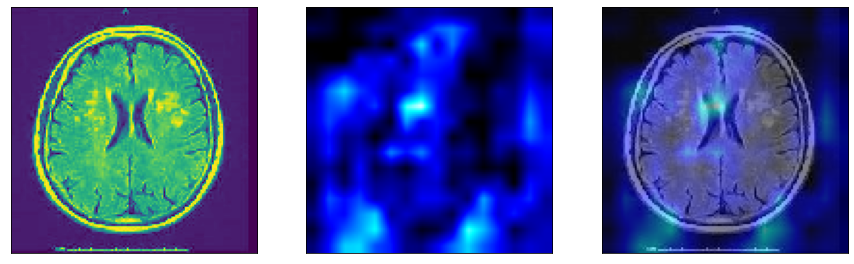

Probabilidad Healthy : 99.9%
Probabilidad Tumor: 0.1%
Real: Healthy





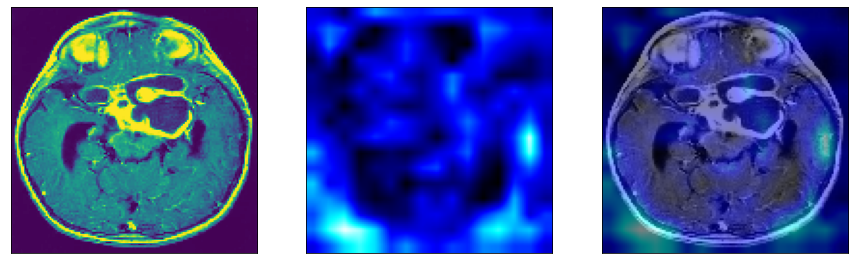

Probabilidad Healthy : 81.2%
Probabilidad Tumor: 18.8%
Real: Tumor





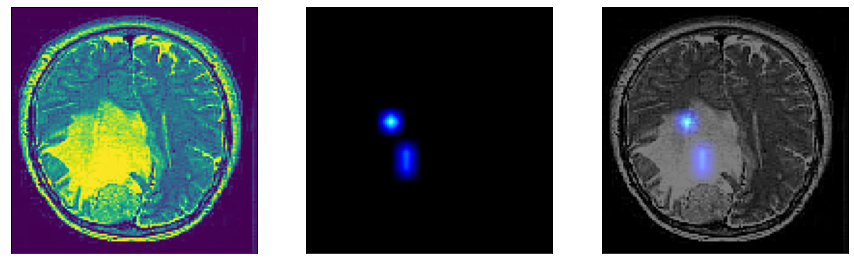

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





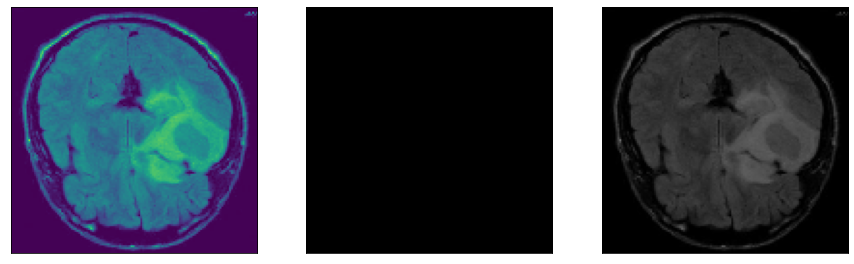

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





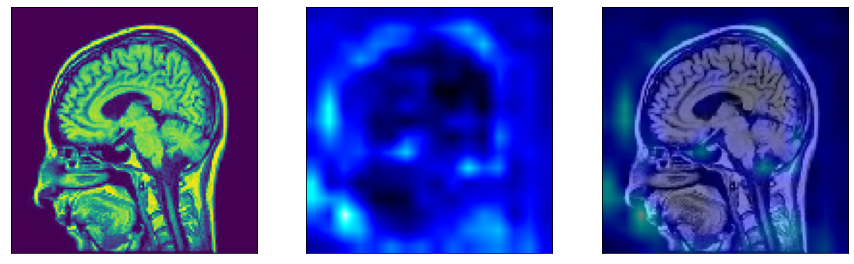

Probabilidad Healthy : 99.9%
Probabilidad Tumor: 0.1%
Real: Healthy





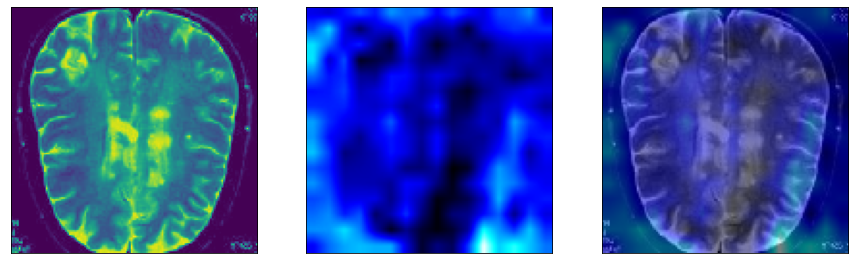

Probabilidad Healthy : 99.5%
Probabilidad Tumor: 0.5%
Real: Healthy





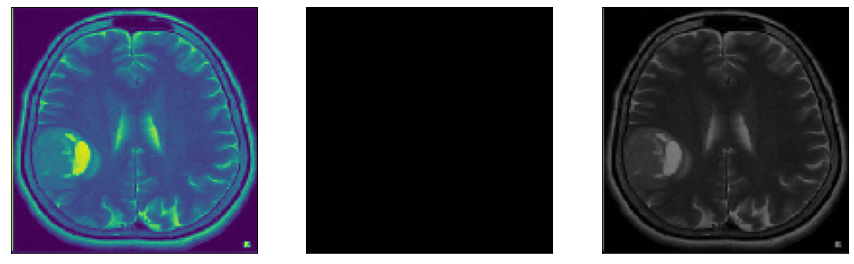

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





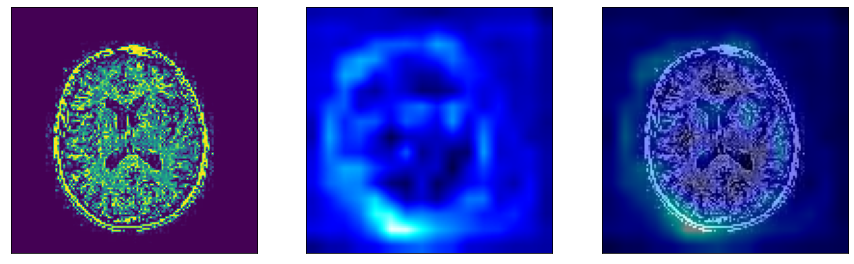

Probabilidad Healthy : 100.0%
Probabilidad Tumor: 0.0%
Real: Healthy





In [ ]:
ind = 1041 # visualizamos 10 ejemplos de test a partir de este (en test hay 2002 ejemplos)
ind = 0

for i in range(ind, ind+60):
    show_heatmap(model, X_te[i], y_te[i])

## Mayores confusiones del Modelo

En este apartado analizaremos, dado un batch de 64 imágenes, aquellas imágenes correspondientes a un cerebro sano donde el modelo ha sacado un porcentaje más alto de probabilidad de tumor y viceversa.

- clase 1: Tumor
- clase 0: Healthy

**Radiografias Healthy en que la red saca mayor probabilidad de Tumor:**

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide


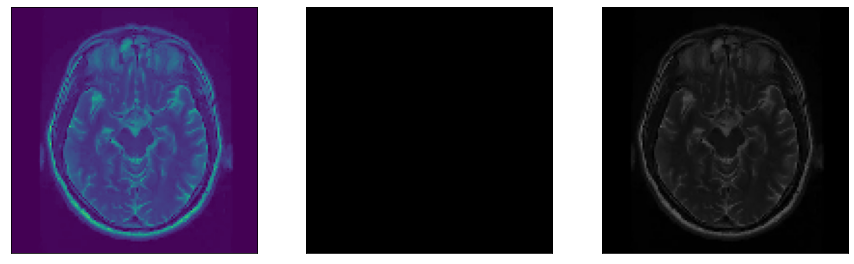

Probabilidad Healthy : 3.6%
Probabilidad Tumor: 96.4%
Real: Healthy





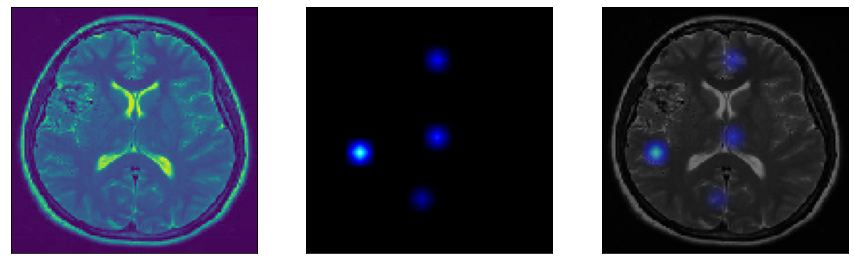

Probabilidad Healthy : 22.6%
Probabilidad Tumor: 77.4%
Real: Healthy





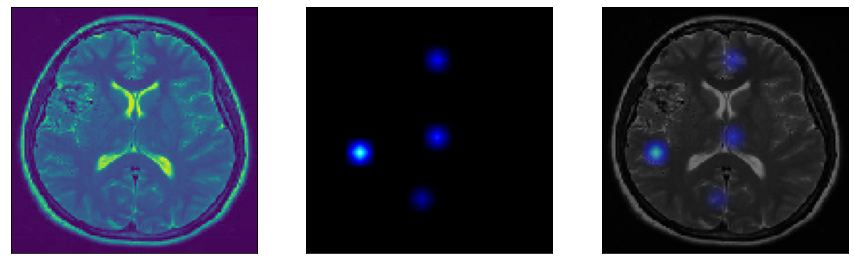

Probabilidad Healthy : 22.6%
Probabilidad Tumor: 77.4%
Real: Healthy





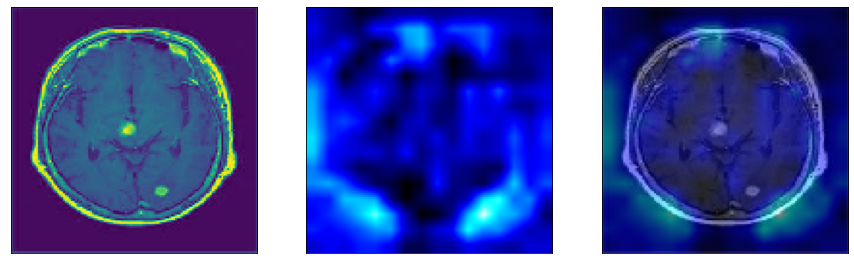

Probabilidad Healthy : 70.2%
Probabilidad Tumor: 29.8%
Real: Healthy





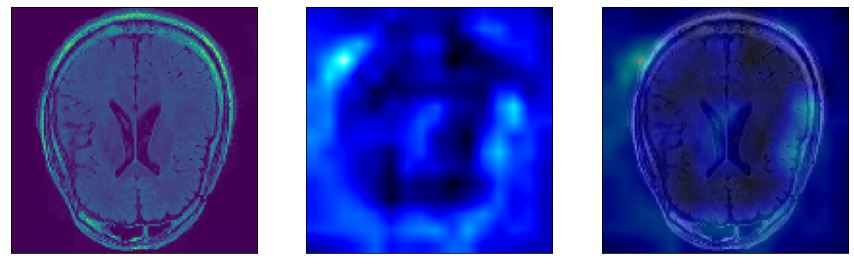

Probabilidad Healthy : 73.9%
Probabilidad Tumor: 26.1%
Real: Healthy





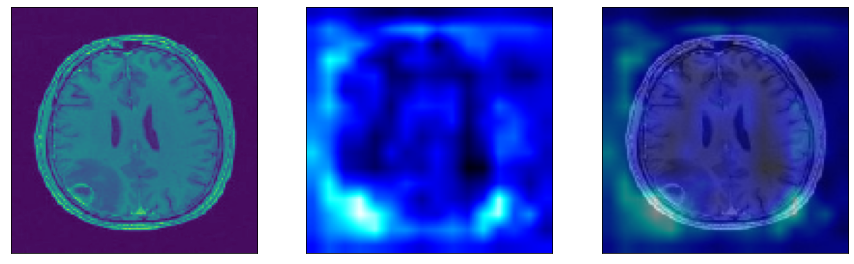

Probabilidad Healthy : 82.4%
Probabilidad Tumor: 17.6%
Real: Healthy





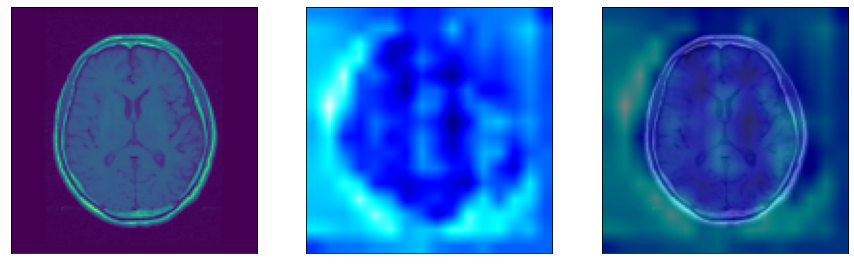

Probabilidad Healthy : 90.7%
Probabilidad Tumor: 9.3%
Real: Healthy





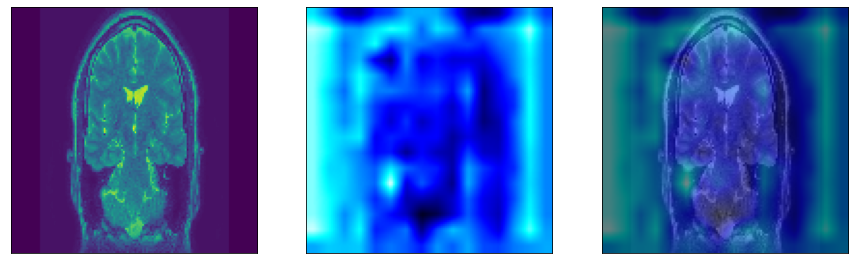

Probabilidad Healthy : 92.7%
Probabilidad Tumor: 7.3%
Real: Healthy





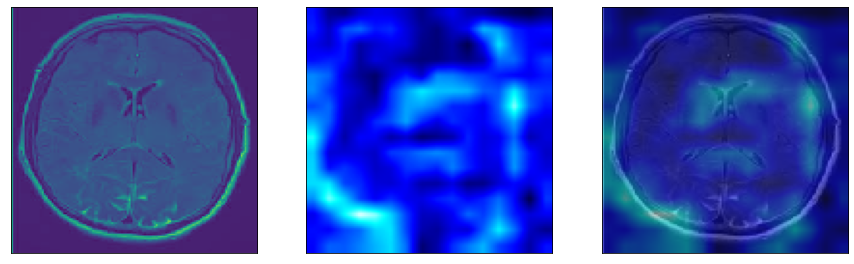

Probabilidad Healthy : 92.9%
Probabilidad Tumor: 7.1%
Real: Healthy





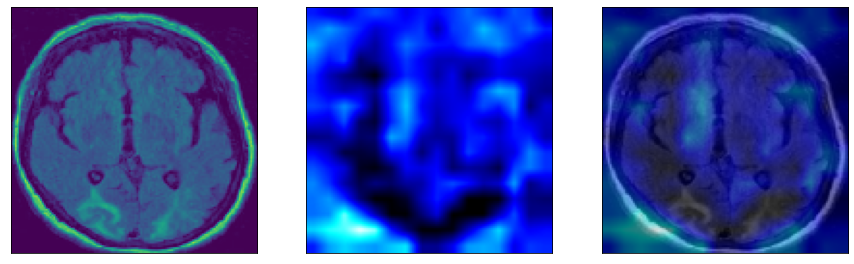

Probabilidad Healthy : 93.2%
Probabilidad Tumor: 6.8%
Real: Healthy





In [ ]:
inds = np.where(y_te[:,class_indices['normal']]==1)[0]
inds = sorted(inds, key=lambda i:y_pred_proba[i,class_indices["normal"]])
for i in inds[:10]:
    show_heatmap(model, X_te[i], y_te[i])

Observamos que de totas las imágenes sanas, el modelo interpreta una probabilidad de tumor de solo el 9,9% en el peor de los casos. 

**Radiografias con Tumor en que la red saca mayor probabilidad de Healthy:**

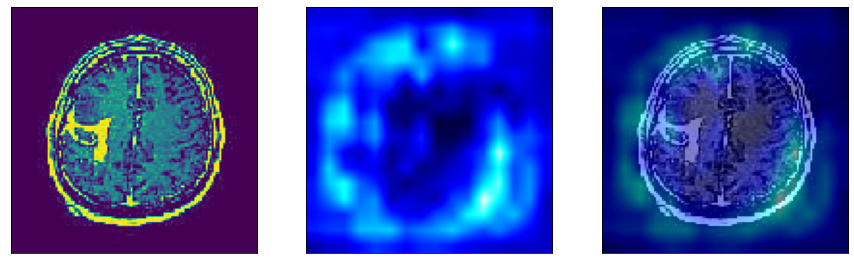

Probabilidad Healthy : 99.9%
Probabilidad Tumor: 0.1%
Real: Tumor





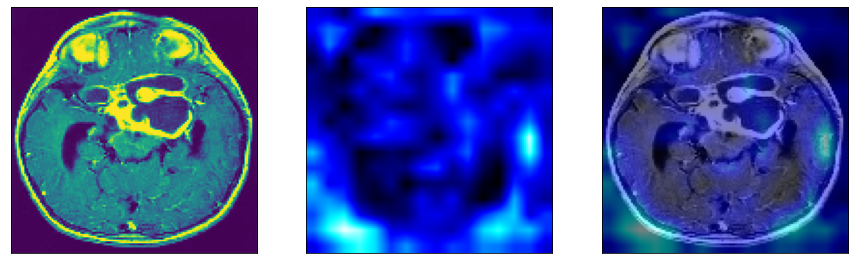

Probabilidad Healthy : 81.2%
Probabilidad Tumor: 18.8%
Real: Tumor





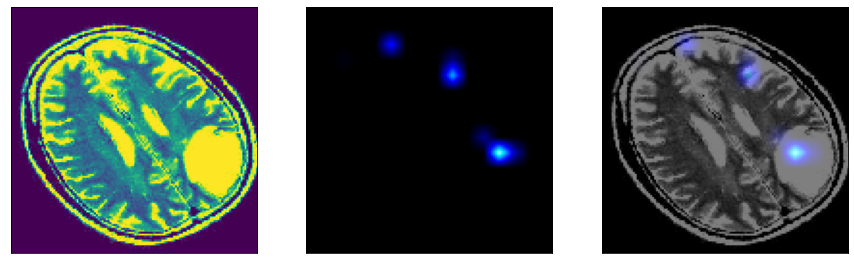

Probabilidad Healthy : 25.3%
Probabilidad Tumor: 74.7%
Real: Tumor





/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide


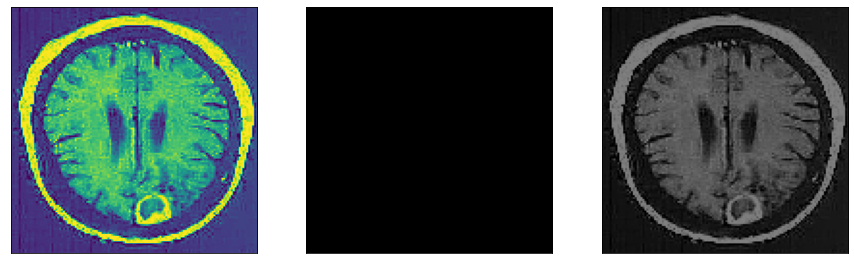

Probabilidad Healthy : 9.2%
Probabilidad Tumor: 90.8%
Real: Tumor





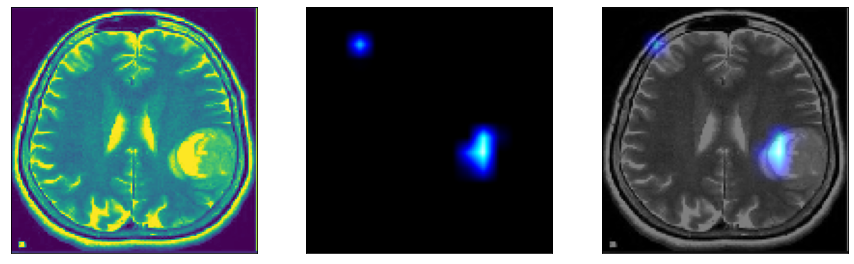

Probabilidad Healthy : 1.0%
Probabilidad Tumor: 99.0%
Real: Tumor





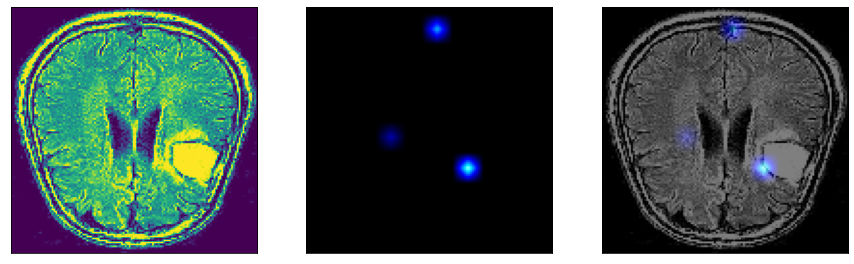

Probabilidad Healthy : 0.2%
Probabilidad Tumor: 99.8%
Real: Tumor





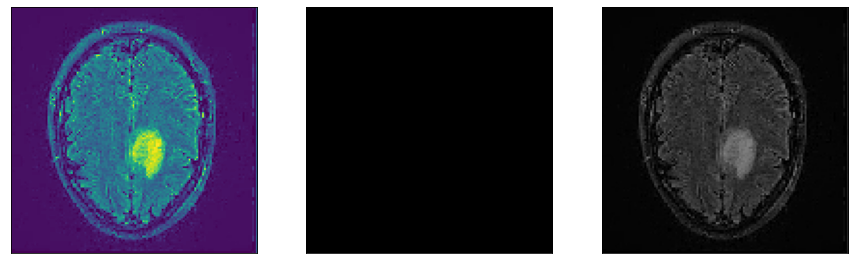

Probabilidad Healthy : 0.2%
Probabilidad Tumor: 99.8%
Real: Tumor





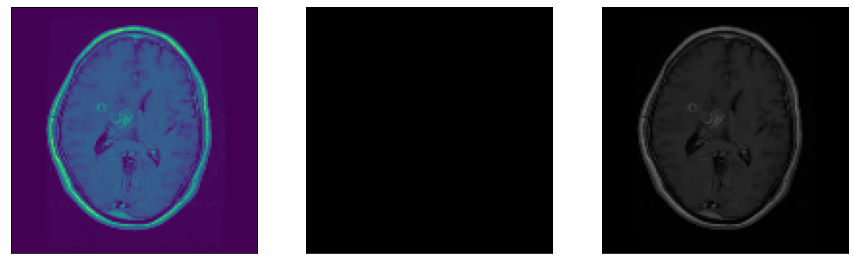

Probabilidad Healthy : 0.1%
Probabilidad Tumor: 99.9%
Real: Tumor





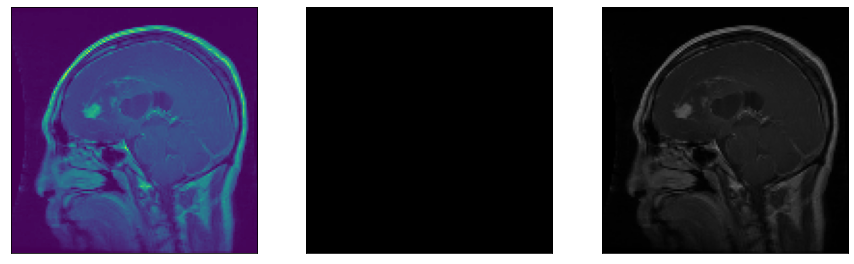

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





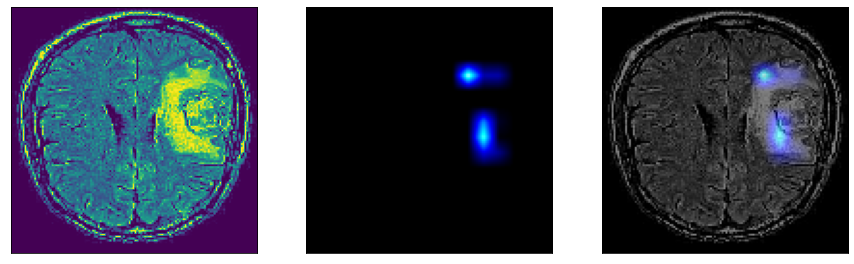

Probabilidad Healthy : 0.0%
Probabilidad Tumor: 100.0%
Real: Tumor





In [ ]:
inds = np.where(y_te[:,class_indices['tumor']]==1)[0]
inds = sorted(inds, key=lambda i:y_pred_proba[i,class_indices["tumor"]])
for i in inds[:10]:
    show_heatmap(model, X_te[i], y_te[i])

En el caso de las imágnes con tumor, sí que vemos que el modelo fallaría en 1 imágen indicando que se trata de un cerebro sano con un 69.3% de probabilidad.

## Transfer Learning

In [ ]:
normed_dims = (224, 224)
batch_size = 64

In [ ]:
from keras.applications.resnet import ResNet50,preprocess_input
base_model = ResNet50(include_top=False, input_shape=normed_dims + (3,))

94781440/94765736 [==============================] - 1s 0us/step


In [ ]:
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

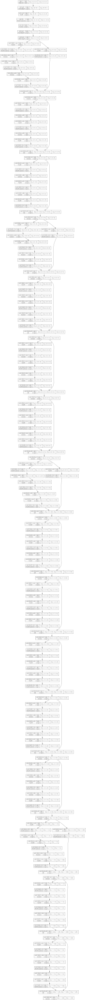

In [ ]:
if COLAB:
    display(SVG(model_to_dot(base_model, show_shapes=True,dpi=72).create(prog='dot', format='svg')))
else:
    display(SVG(model_to_dot(base_model, show_shapes=True).create(prog='dot', format='svg')))

In [ ]:
for layer in base_model.layers:
    layer.trainable = False # Transfer learning "duro"
    #layer.trainable = True # Retuning de la red descargada (si weights="imagenet")
    #layer.trainable = True # Entrenamiento de 0 de la red descargada (si weights=None)

In [ ]:
len(base_model.layers)

175

In [ ]:
# capas que añado:

aux1 = base_model.output

aux2 = Flatten(input_shape = (2048,))(aux1)

aux3 = Dense(64, activation='relu')(aux2)
aux4 = BatchNormalization()(aux3)
aux5 = Dropout(rate=0.4)(aux4)

aux6 = Dense(64, activation='relu')(aux5)
aux7 = BatchNormalization()(aux6)
aux8 = Dropout(rate=0.3)(aux7)  

aux9 = Dense(32, activation='relu')(aux8)
aux10 = BatchNormalization()(aux9)
aux11 = Dropout(rate=0.3)(aux10)    

aux12 = Dense(2, activation="softmax")(aux11)

model = Model(inputs=base_model.input, outputs=aux12)

model.compile(optimizer=keras.optimizers.Adam(0.001),loss ='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

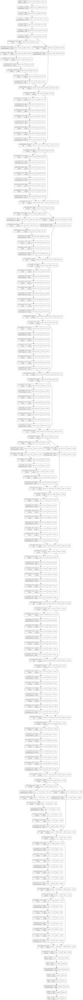

In [ ]:
if COLAB:
    display(SVG(model_to_dot(model, show_shapes=True,dpi=72).create(prog='dot', format='svg')))
else:
    display(SVG(model_to_dot(model, show_shapes=True).create(prog='dot', format='svg')))

In [ ]:
train_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function = preprocess_input,
    rotation_range=5,
    width_shift_range=0.05,
    height_shift_range=0.05,
    fill_mode='reflect',
    shear_range=0.1,
    zoom_range=0.1)

val_datagen  = ImageDataGenerator(dtype='float32',
                                  preprocessing_function = preprocess_input)

test_datagen = ImageDataGenerator(dtype='float32',
                                  preprocessing_function = preprocess_input)

In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train,
    x_col = "filepath",
    y_col = "class",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=True,
    color_mode="rgb",
    class_mode='categorical') # binary: 0/1. Sparse: entero a partir de 0. Categorical: one hot

validation_generator = val_datagen.flow_from_dataframe(
    dataframe=val,
    x_col = "filepath",
    y_col = "class",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    color_mode="rgb",
    class_mode='categorical') # binary: 0/1. Sparse: entero a partir de 0. Categorical: one hot

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test,
    x_col = "filepath",
    y_col = "class",
    target_size=normed_dims,
    batch_size=batch_size,
    shuffle=False,
    color_mode="rgb",
    class_mode='categorical') # binary: 0/1. Sparse: entero a partir de 0. Categorical: one hot

Found 3024 validated image filenames belonging to 2 classes.
Found 756 validated image filenames belonging to 2 classes.
Found 420 validated image filenames belonging to 2 classes.


In [ ]:
train_generator.class_indices

{'normal': 0, 'tumor': 1}

In [ ]:
number_train_samples = train_generator.n
number_val_samples   = validation_generator.n
number_test_samples  = test_generator.n

number_train_samples, number_val_samples, number_test_samples

(3024, 756, 420)

In [ ]:
acum_tr_acc = []
acum_val_acc = []
best_val_acc = -1000
acum_tr_loss  = []
acum_val_loss = []

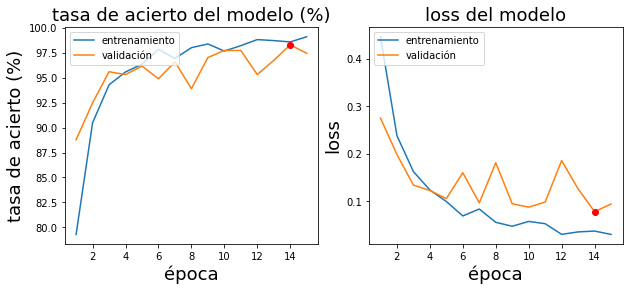

In [ ]:
epochs = 5

modelpath="best_model_TL.h5"

checkpoint = ModelCheckpoint(modelpath, monitor='val_accuracy', verbose=1,
                              save_best_only=True,
                              mode='max') # graba sólo los que mejoran en validación
callbacks_list = [checkpoint]

if TRAINNING_TL:
  for e in range(epochs):
      history = model.fit_generator(generator = train_generator, 
                                    steps_per_epoch=number_train_samples // batch_size,
                                    epochs=1,
                                    callbacks=callbacks_list,
                                    verbose=1,
                                    shuffle = True,
                                    validation_data=validation_generator,
                                    validation_steps=number_val_samples // batch_size
                                    )
      
      if history.history['val_accuracy'][-1] > best_val_acc:
          print("Validation accuracy improved from",
              best_val_acc, 'to', history.history['val_accuracy'])
          print("saving weights")
          best_val_acc = history.history['val_accuracy'][-1]
      
      acum_tr_acc.append(history.history['accuracy'][0])
      acum_val_acc.append(history.history['val_accuracy'][0])
      acum_tr_loss.append(history.history['loss'][0])
      acum_val_loss.append(history.history['val_loss'][0])
      
      if len(acum_tr_acc) > 1:
          clear_output()
          best_i = np.argmax(acum_val_acc)
          grafica_entrenamiento(acum_tr_acc, acum_val_acc, acum_tr_loss, acum_val_loss, best_i)

In [ ]:
model = load_model(modelpath)

In [ ]:
scores_tr = model.evaluate(train_generator)
print('Train loss    :', scores_tr[0])
print('Train accuracy:', scores_tr[1])
print()

scores_val = model.evaluate(validation_generator)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = model.evaluate(test_generator)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

48/48 [==============================] - 48s 966ms/step - loss: 0.0045 - accuracy: 0.9983
Train loss    : 0.004494092892855406
Train accuracy: 0.9983465671539307

12/12 [==============================] - 7s 573ms/step - loss: 0.0826 - accuracy: 0.9828
Val loss    : 0.08261795341968536
Val accuracy: 0.9828042387962341

7/7 [==============================] - 4s 612ms/step - loss: 0.0946 - accuracy: 0.9762
Test loss     : 0.0946018248796463
Test accuracy : 0.976190447807312


## Conclusiones